In [11]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import openpyxl
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
import numpy as np
from sklearn.svm import SVR
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings("ignore")

In [12]:
xls = pd.ExcelFile('MainData.xlsx')

In [13]:
sheet_names = xls.sheet_names

In [14]:
sheet_names

['National',
 'Azuay',
 'Bolivar',
 'Canar',
 'Carchi',
 'Cotopaxi',
 'Chimborazo',
 'Gold',
 'Emeralds',
 'Guayas',
 'Imbabura',
 'Shop',
 'The Rivers',
 'Manabi',
 'Morana Santiago',
 'Napo',
 'Pasta',
 'Pichincha',
 'Tungurahua',
 'Zamora Chinchipe',
 'Galapagos',
 'Sucumbios',
 'Orellana',
 'Santo',
 'St. Helen']

## Logistic Regression

In [15]:
# models_RFR = {}
# predictions_RFR = {}

##### Result Analysis

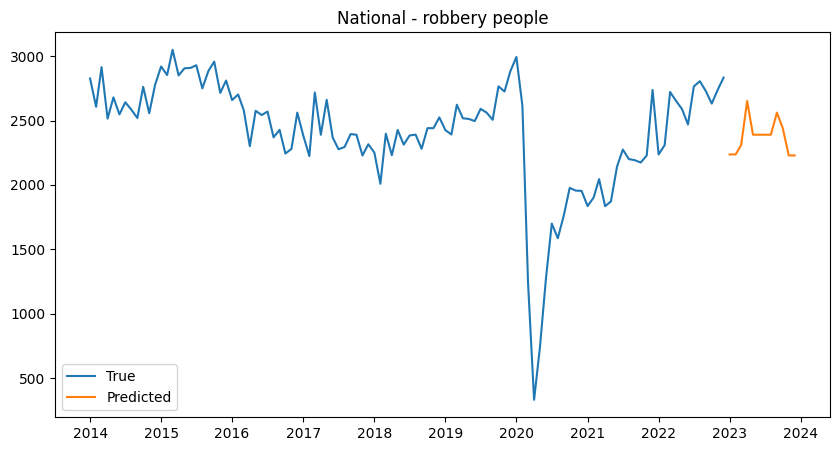

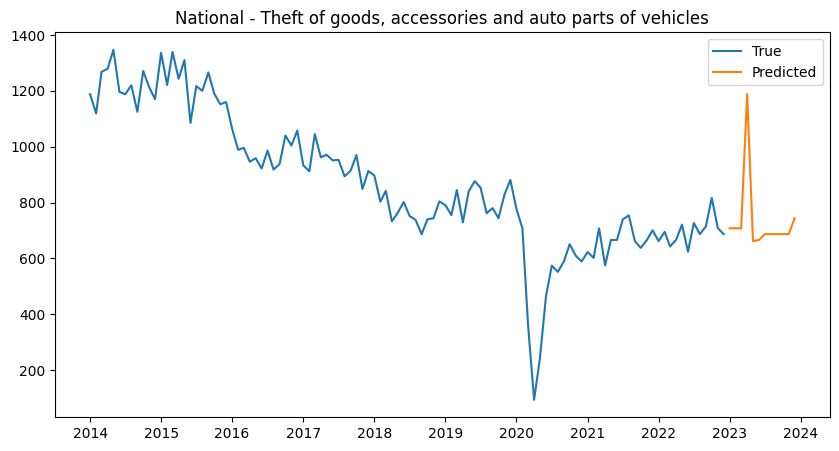

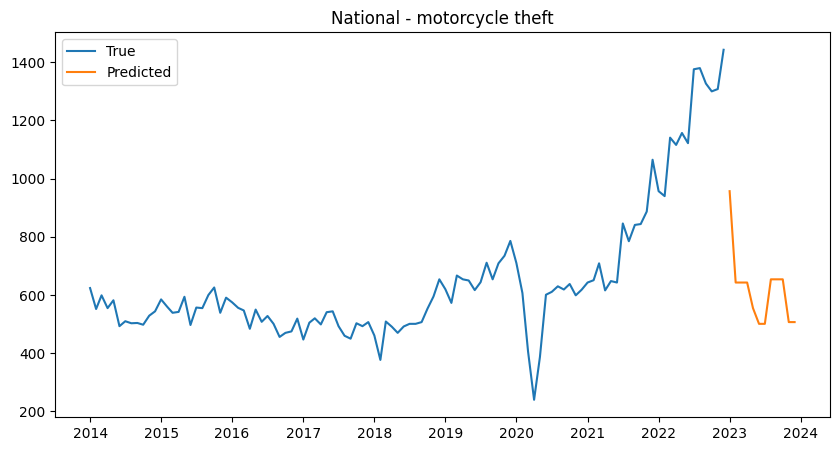

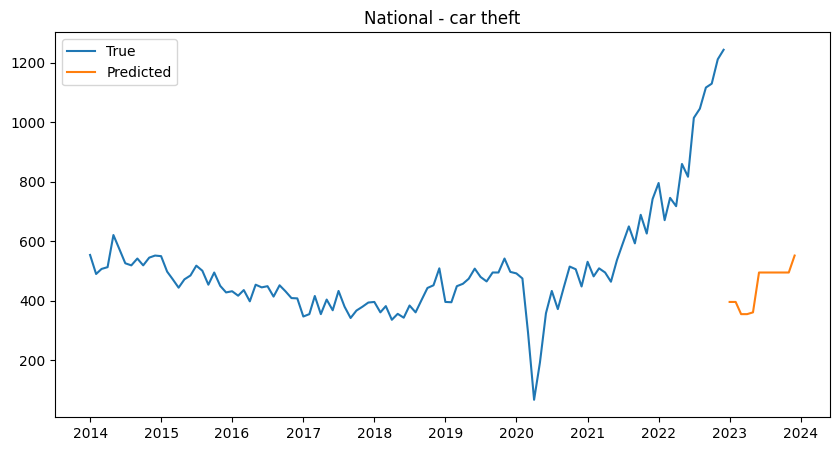

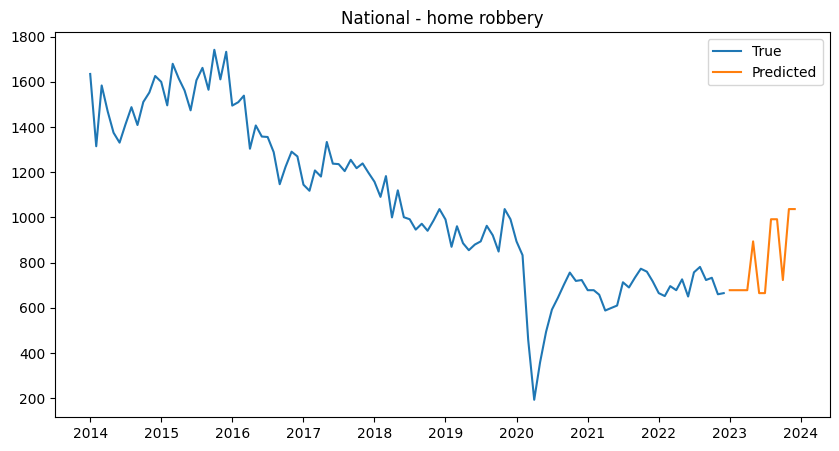

...

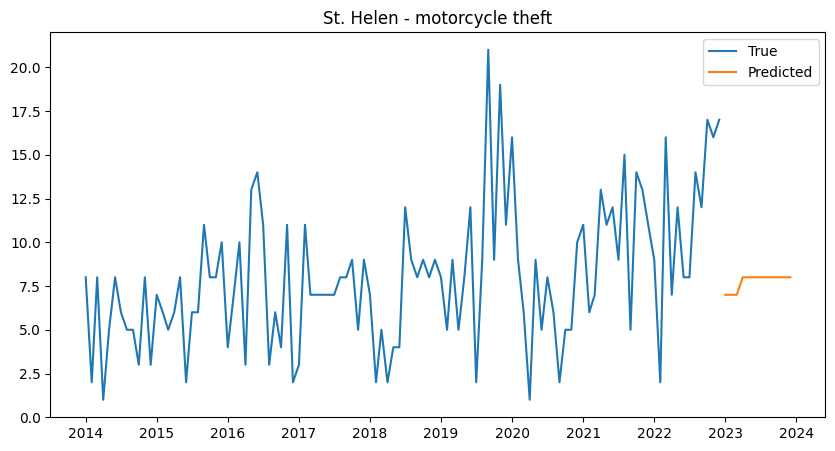

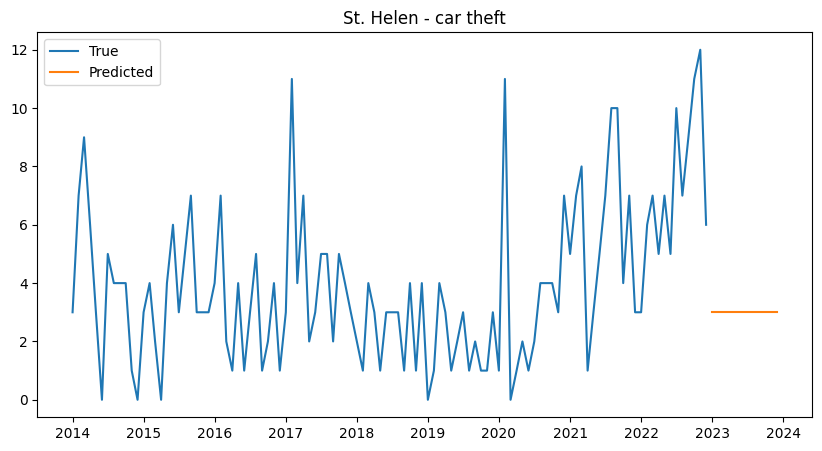

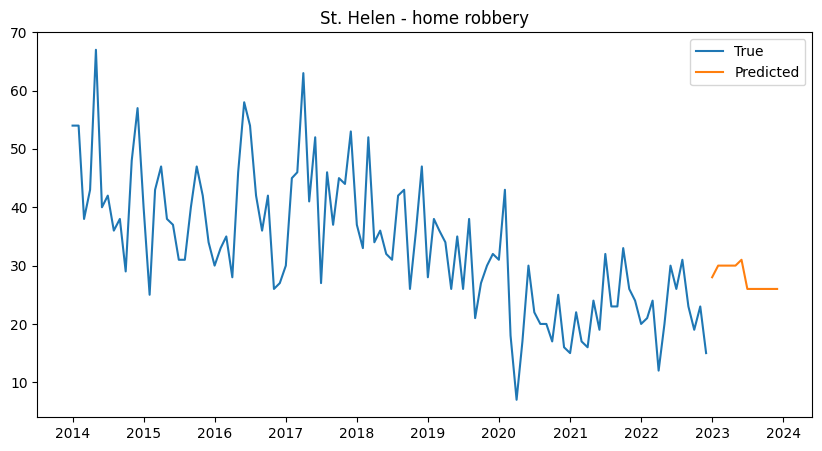

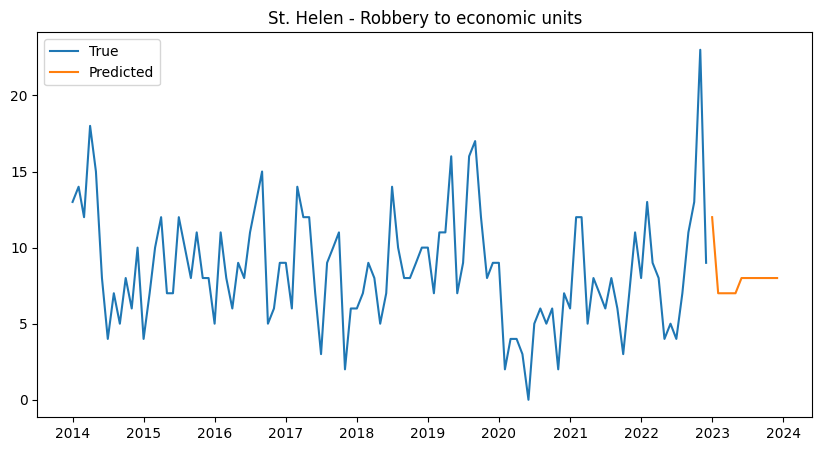

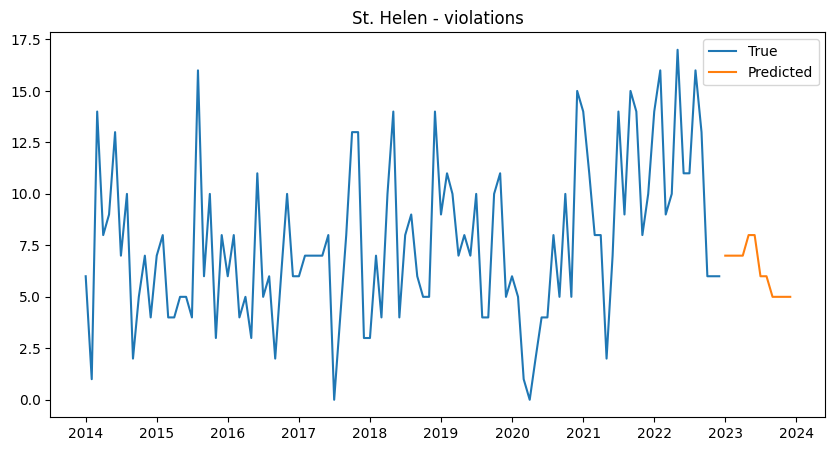

In [16]:
with pd.ExcelWriter('Predictions_BeforeTuning.xlsx', engine='openpyxl') as writer:
    # Loop through each sheet
    for sheet in sheet_names:
        df = pd.read_excel(xls, sheet)

        df = df.melt(id_vars=['Highest incidence crimes'], var_name='date', value_name='count')

        df['date'] = pd.to_datetime(df['date'], format='%b-%y')
        df['year'] = df['date'].dt.year
        df['month'] = df['date'].dt.month

        future_df = pd.DataFrame()

        # Loop through each crime type
        for crime in df['Highest incidence crimes'].unique():
            crime_df = df[df['Highest incidence crimes'] == crime]

            X = crime_df[['year', 'month']]
            y = crime_df['count']
            
            model = LogisticRegression(max_iter=2000)
            model.fit(X, y)

            # Make predictions (for next 12 months)
            future_months = pd.DataFrame({'year': [2023]*12, 'month': list(range(1, 13))})

            future_counts = model.predict(future_months)

#             models_RFR[(sheet, crime)] = model
#             predictions_RFR[(sheet, crime)] = future_counts

            for i, count in enumerate(future_counts):
                future_df.at[i, 'date'] = pd.to_datetime(f"{future_months.at[i, 'year']}-{future_months.at[i, 'month']}", format='%Y-%m')
                future_df.at[i, crime] = count

            plt.figure(figsize=(10, 5))
            plt.plot(crime_df['date'], y, label='True')
            plt.plot(future_df['date'], future_df[crime], label='Predicted')
            plt.title(f"{sheet} - {crime}")
            plt.legend()
            plt.show()


        future_df_wide = future_df.melt(id_vars=['date'], var_name='Highest incidence crimes', value_name='count')

        future_df_wide.to_excel(writer, sheet_name=sheet, index=False)

##### Cross-Validation

In [17]:
from sklearn.model_selection import cross_val_score

# Loop through each crime type
for crime in df['Highest incidence crimes'].unique():
    crime_df = df[df['Highest incidence crimes'] == crime]

    X = crime_df[['year', 'month']]
    y = crime_df['count']

    model = LogisticRegression(max_iter=2000)

    # Perform cross-validation
    scores = cross_val_score(model, X, y, cv=5)

    # Print the cross-validation scores
    print(f"Cross-Validation Scores for {crime}: {scores}")
    print(f"Mean Cross-Validation Score for {crime}: {np.mean(scores)}")


Cross-Validation Scores for robbery people: [0.04545455 0.04545455 0.04545455 0.0952381  0.04761905]
Mean Cross-Validation Score for robbery people: 0.05584415584415584
Cross-Validation Scores for Theft of goods, accessories and auto parts of vehicles: [0.04545455 0.09090909 0.09090909 0.04761905 0.04761905]
Mean Cross-Validation Score for Theft of goods, accessories and auto parts of vehicles: 0.06450216450216449
Cross-Validation Scores for motorcycle theft: [0.18181818 0.18181818 0.13636364 0.14285714 0.19047619]
Mean Cross-Validation Score for motorcycle theft: 0.16666666666666666
Cross-Validation Scores for car theft: [0.13636364 0.18181818 0.18181818 0.19047619 0.0952381 ]
Mean Cross-Validation Score for car theft: 0.15714285714285714
Cross-Validation Scores for home robbery: [0.         0.04545455 0.04545455 0.04761905 0.04761905]
Mean Cross-Validation Score for home robbery: 0.03722943722943723
Cross-Validation Scores for Robbery to economic units: [0.13636364 0.09090909 0.09090

##### Hyperparameter Tuning

In [19]:
from sklearn.model_selection import GridSearchCV

# Loop through each crime type
for crime in df['Highest incidence crimes'].unique():
    crime_df = df[df['Highest incidence crimes'] == crime]

    X = crime_df[['year', 'month']]
    y = crime_df['count']

    # Define the hyperparameter grid
    param_grid = {
        'C': [0.1, 1, 10],
        'penalty': ['l2']  # Change penalty to 'l2'
    }

    model = LogisticRegression(max_iter=2000) 

    # Perform grid search
    grid_search = GridSearchCV(model, param_grid, cv=5)
    grid_search.fit(X, y)

    # Print the best hyperparameters
    print(f"Best Hyperparameters for {crime}: {grid_search.best_params_}")
    print(f"Best Score for {crime}: {grid_search.best_score_}")

Best Hyperparameters for robbery people: {'C': 0.1, 'penalty': 'l2'}
Best Score for robbery people: 0.05584415584415584
Best Hyperparameters for Theft of goods, accessories and auto parts of vehicles: {'C': 0.1, 'penalty': 'l2'}
Best Score for Theft of goods, accessories and auto parts of vehicles: 0.07402597402597402
Best Hyperparameters for motorcycle theft: {'C': 0.1, 'penalty': 'l2'}
Best Score for motorcycle theft: 0.16666666666666666
Best Hyperparameters for car theft: {'C': 0.1, 'penalty': 'l2'}
Best Score for car theft: 0.16666666666666666
Best Hyperparameters for home robbery: {'C': 0.1, 'penalty': 'l2'}
Best Score for home robbery: 0.03722943722943723
Best Hyperparameters for Robbery to economic units: {'C': 0.1, 'penalty': 'l2'}
Best Score for Robbery to economic units: 0.1103896103896104
Best Hyperparameters for violations: {'C': 1, 'penalty': 'l2'}
Best Score for violations: 0.11125541125541125
